In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import cv2
import skimage
from numba import jit
from modules.process import Process
from modules.helper import display_images, display_stats
from modules.fitting import fit2circle, fit2circle_points, fit_points_to_circle_iteration, cross_circle_and_labels
from modules.mask import get_dilated_mask, get_mask
from modules.bright2dark import create_b2d_data, reduce_b2d_noise
from modules.labels import *
from config import base_dir

In [ ]:
conf = {
    'gaussian_blur_ksize': 7,
    'dust_mask_dilate_ksize': 11,
    'sobel_ksize': 3,
    'b2d_cos_thresh': 0.3,
    'b2d_vector_blur_ksize': 11,
    'b2d_vector_mass_center_sigma': 2,
    'b2d_vector_noise_sigma': 2,
    'large_label_thresh_size': 1000,
    'large_label_thresh_sigma': 1,
    'cross_extra_width_inside': 5,
    'cross_extra_width_outside': 50,
    'cross_ratio_thresh': 0.1,
    'fitting_extra_width_outside': 5,
    'fitting_iteraion_number': 2,
}

def test(instance: Process, index: int, conf):
    images = []
    gray = np.copy(instance.gray_images[index])
    blurred = cv2.GaussianBlur(gray, ksize=(conf['gaussian_blur_ksize'], conf['gaussian_blur_ksize']), sigmaX=0, sigmaY=0)
    dust_mask = get_dilated_mask(instance.dust_mask, conf['dust_mask_dilate_ksize'])
    b2d_vector_image, b2d_cos_image, b2d_mass_center = create_b2d_data(blurred, dust_mask, conf['sobel_ksize'], conf['b2d_vector_mass_center_sigma'])
    b2d_cos_mask = get_mask(b2d_cos_image, conf['b2d_cos_thresh'])
    noise_reduced_b2d_vector_image = reduce_b2d_noise(b2d_vector_image, b2d_cos_mask, dust_mask, conf['b2d_vector_blur_ksize'], conf['b2d_vector_noise_sigma'])
    
    # 十分大きい連続領域を検出する
    nlabels, labels = cv2.connectedComponents(noise_reduced_b2d_vector_image.astype('uint8'))
    display_label_sizes(nlabels, labels, conf['large_label_thresh_size'], conf['large_label_thresh_sigma'])
    large_label_indices = get_large_label_indices(nlabels, labels, conf['large_label_thresh_size'], conf['large_label_thresh_sigma'])
    large_labels = np.zeros(labels.shape)
    for index in large_label_indices:
        large_labels[labels == index] = 1

    # 近似円の内側の余計な連続領域を排除する
    arr_circle, _ = fit_points_to_circle_iteration(large_labels, itr=1)
    good_label_indices = large_label_indices[cross_circle_and_labels(labels, large_label_indices, arr_circle[0][0], arr_circle[0][1], arr_circle[0][2], w_in=conf['cross_extra_width_inside'], w_out=conf['cross_extra_width_outside'], thresh=conf['cross_ratio_thresh'])]
    
    # 残った連続領域上の点群を円近似
    good_labels = np.zeros(labels.shape)
    for label_id in good_label_indices:
        good_labels[labels == label_id] = 1
    arr_circle, arr_points = fit_points_to_circle_iteration(good_labels, w_out=conf['fitting_extra_width_outside'], itr=conf['fitting_iteraion_number'])

    # draw
    canvas = np.copy(gray)
    for i in range(len(arr_circle)):
        cx, cy, cr = map(int, arr_circle[i])
        cv2.circle(canvas, (cx, cy), cr, color=0, thickness=1+i)

    print('mass center of b2d vectors', b2d_mass_center)
    images = [gray, blurred, b2d_vector_image, b2d_cos_image, b2d_cos_mask, noise_reduced_b2d_vector_image, labels, large_labels, good_labels, canvas]
    names = ['gray', 'blurred', 'b2d_vector_image', 'b2d_cos_image', 'b2d_cos_mask', 'noise reduced b2d_vector', 'labels', 'large_labels', 'good labels', 'circle fitting']
    display_images(images, names, w=4)
    return images

In [3]:
path = '/mnt/c/Users/hiran/Documents/Research/Experiment_data/Droplet/20240209/20240209_3-branch_Y3-3x5_deg55_wu_exp100ms_ph2_take1_cropped.tif'
instance = Process(path)

dust_mask = np.zeros(instance.gray_images[0].shape)
cv2.circle(dust_mask, (100, 148), 16, color=1, thickness=-1)
cv2.circle(dust_mask, (523, 305), 13, color=1, thickness=-1)
cv2.circle(dust_mask, (450, 483), 11, color=1, thickness=-1)
instance.dust_mask = dust_mask

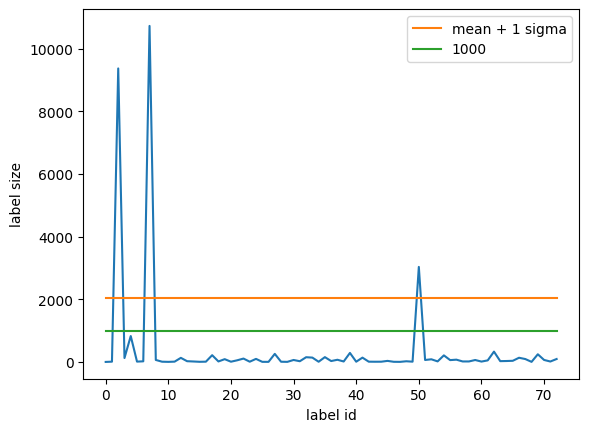

mass center of b2d vectors (330.9535602589279, 355.94774165393846)


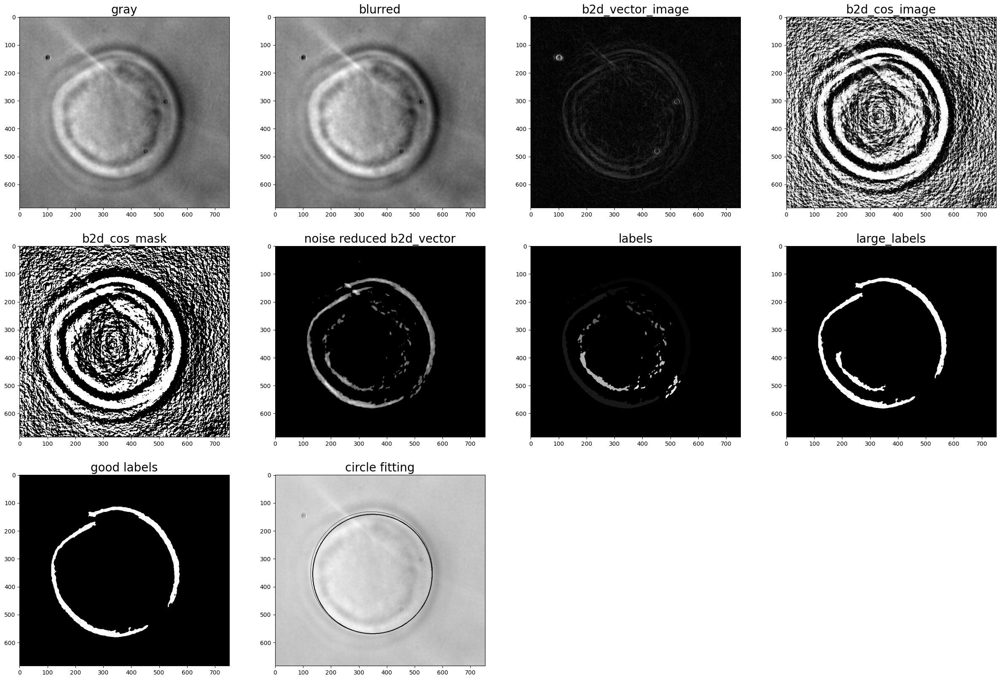

[array([[10961, 11007, 10705, ..., 10514, 10554, 10326],
        [11295, 10770, 10652, ..., 10203, 10459, 10482],
        [11278, 10904, 10661, ..., 10604, 10488, 10677],
        ...,
        [10237,  9765, 10478, ..., 10078, 10188, 10140],
        [10184,  9950, 10120, ..., 10579, 10585, 10473],
        [10269,  9969, 10245, ..., 10018, 10295, 10330]], dtype=uint16),
 array([[10913, 10882, 10828, ..., 10537, 10503, 10492],
        [10919, 10889, 10839, ..., 10550, 10519, 10509],
        [10932, 10907, 10867, ..., 10587, 10560, 10550],
        ...,
        [10144, 10151, 10169, ..., 10299, 10292, 10290],
        [10111, 10122, 10151, ..., 10328, 10332, 10334],
        [10101, 10113, 10146, ..., 10340, 10349, 10352]], dtype=uint16),
 array([[  0.        , 330.        , 290.        , ..., 300.        ,
         172.        ,   0.        ],
        [ 88.        , 328.27426147, 306.36578369, ..., 333.68548584,
         276.00723267, 230.        ],
        [120.        , 299.80328369, 299.8

In [6]:
test(instance, 30, conf)

# 液滴を円で近似、曲率を算出
index 60以降は、境界が不明瞭であるため、うまく近似するには時間的連続性を考慮する必要あり。（未実装）

In [27]:
"""
円で近似
"""
def get_noise_suppressed_b2d_vector_image(b2d_vector_image, b2d_cos_image, b2d_cos_thresh, dust_mask):
    dst = b2d_vector_image.copy()
    dst[dust_mask == 1] = 0
    dst[b2d_cos_image < b2d_cos_thresh] = 0
    dst = cv2.GaussianBlur(dst, (11, 11), sigmaX=0, sigmaY=0)
    thresh = np.mean(dst) + np.std(dst) * 2
    dst[dst < thresh] = 0
    return dst

def get_large_label_indices(nlabels, labels, debug_mode=False):
    label_sizes = count_label_sizes(nlabels, labels)
    if debug_mode:
        plt.plot(label_sizes) # debug
        plt.plot([np.mean(label_sizes) + np.std(label_sizes)] * len(label_sizes), label='mean + 1 sigma')
        plt.ylabel('label size')
        plt.legend()
    thresh = min(1000, np.mean(label_sizes) + np.std(label_sizes))
    return np.where(label_sizes > thresh)[0]

#############################################################################

def test_run2(instance, index, b2d_cos_thresh=0.3):
    gray = instance.gray_images[index]
    dust_mask = get_dilated_mask(instance.dust_mask)

    # b2d data
    blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
    b2d_vector_image, b2d_cos_image, mass_center_point = create_b2d_data(blurred, dust_mask, sobel_ksize=3, sigma=2)
    print('mass center of b2d vectors', mass_center_point)

    # ノイズ除去
    noise_suppressed = get_noise_suppressed_b2d_vector_image(b2d_vector_image, b2d_cos_image, b2d_cos_thresh, dust_mask)
    noise_suppressed[noise_suppressed > 0] = 1
    noise_suppressed = cv2.dilate(noise_suppressed.astype('uint8'), kernel=(5, 5))

    # 細かい領域は無視する
    nlabels, labels = cv2.connectedComponents(noise_suppressed.astype('uint8'))
    large_label_indices = get_large_label_indices(nlabels, labels, debug_mode=True)
    large_labels = np.zeros(labels.shape)
    for index in large_label_indices:
        large_labels[labels == index] = 1

    # 余分なlabelを排除する
    binary_image = np.zeros(large_labels.shape)
    binary_image[large_labels > 0] = 1
    arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, itr=1)
    # cv2.circle(large_labels, (int(arr_circle[0][0]), int(arr_circle[0][1])), int(arr_circle[0][2]), 2, 2)
    appropriate_label_indices = large_label_indices[cross_circle_and_labels(labels, large_label_indices, arr_circle[0][0], arr_circle[0][1], arr_circle[0][2], w_in=5, w_out=50, thresh=0.1)]

    # 絞り込んだlabelたちを円近似
    binary_image = np.zeros(labels.shape)
    for label_id in appropriate_label_indices:
        binary_image[labels == label_id] = 1
    num_itr = 2
    arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, w_out=5, itr=num_itr)

    # draw
    canvas = np.copy(gray)
    for i in range(num_itr):
        cx, cy, cr = map(int, arr_circle[i])
        cv2.circle(canvas, (cx, cy), cr, color=0, thickness=1+i)
    
    print('large label indices:', large_label_indices)
    images = [gray, b2d_vector_image, b2d_cos_image, noise_suppressed, labels, large_labels, binary_image, canvas]
    names = ['gray', 'b2d vector', 'b2d cos', 'noise_suppressed', 'labels', 'large_labels', 'good labels', 'circle fitting']
    display_images(images, names, w=4)
    return images

def run2(instance, indices):
    list_appropriate_labels = []
    list_arr_circle = []
    list_arr_points = []
    for index in indices:
        gray = instance.gray_images[index]
        dust_mask = get_dilated_mask(instance.dust_mask)

        # b2d data
        blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
        b2d_vector_image, b2d_cos_image, _ = create_b2d_data(blurred, dust_mask, sobel_ksize=3)

        # ノイズ除去
        noise_suppressed = get_noise_suppressed_b2d_vector_image(b2d_vector_image, b2d_cos_image, dust_mask)
        noise_suppressed[noise_suppressed > 0] = 1
        noise_suppressed = cv2.dilate(noise_suppressed.astype('uint8'), kernel=(5, 5))

        # 細かい領域は無視する
        nlabels, labels = cv2.connectedComponents(noise_suppressed.astype('uint8'))
        large_label_indices = get_large_label_indices(nlabels, labels, debug_mode=False)
        large_labels = np.zeros(labels.shape)
        for index in large_label_indices:
            large_labels[labels == index] = 1

        # 余分なlabelを排除する
        binary_image = np.zeros(large_labels.shape)
        binary_image[large_labels > 0] = 1

        arr_circle, arr_points = fit_points_to_circle_iteration(binary_image, itr=1)
        appropriate_label_indices = large_label_indices[cross_circle_and_labels(labels, large_label_indices, arr_circle[0][0], arr_circle[0][1], arr_circle[0][2], w_in=5, w_out=50, thresh=0.1)]

        # 絞り込んだlabelたちを円近似
        appropriate_labels = np.zeros(labels.shape, dtype='uint8')
        for label_id in appropriate_label_indices:
            appropriate_labels[labels == label_id] = 1
        
        num_itr = 2
        arr_circle, arr_points = fit_points_to_circle_iteration(appropriate_labels, w_out=5, itr=num_itr)

        list_appropriate_labels.append(appropriate_labels)
        list_arr_circle.append(arr_circle)
        list_arr_points.append(arr_points)
    
    return list_appropriate_labels, list_arr_circle, list_arr_points

In [28]:
""" 近似円を扇形に分割した円弧に対応する点群ごとの曲率半径を集計 """

@jit(nopython=True)
def create_divided_image(image, cx, cy, standard_vec, angle):
    dst = np.zeros(image.shape)
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            if image[y, x] == 0:
                continue
            vec = np.array([x - cx, y - cy])
            r = np.linalg.norm(vec)
            if np.dot(vec / r, standard_vec) >= np.cos(angle):
                dst[y, x] = 1
    return dst

@jit(nopython=True)
def find_double_arcs(mask, cx, cy, labels):
    for y in range(mask.shape[0]):
        for x in range(mask.shape[1]):
            label_id = labels[y, x]
            if label_id == 0:
                continue
            v = np.array([x - cx, y - cy])
            v /= np.linalg.norm(v)
            for y2 in range(mask.shape[0]):
                for x2 in range(mask.shape[1]):
                    label_id2 = labels[y2, x2]
                    if label_id2 == 0 or label_id == label_id2:
                        continue
                    v2 = np.array([x2 - cx, y2 - cy])
                    v2 /= np.linalg.norm(v2)
                    if (1 - np.dot(v, v2)) < 1e-6:
                        return 1
    return 0

def remove_noise_areas(mask, cx, cy, thresh):
    nlabels, labels = cv2.connectedComponents(mask.astype('uint8'))
    dst = mask.copy()
    if find_double_arcs(mask, cx, cy, labels) == 1:
        # ラベルサイズの比が大きければ、最大のラベルのみ抽出する
        label_sizes = count_label_sizes(nlabels, labels)
        max_label_ratio = np.max(label_sizes[1:]) / np.sum(label_sizes[1:])
        if max_label_ratio >= thresh:
            max_label_id = int(np.argmax(label_sizes))
            dst[labels != max_label_id] = 0
        else:
            dst = np.zeros(dst.shape)
    return dst

def compute_divided_curvature_radii(appropriate_labels, cx, cy, division_number, angle):
    masks = []
    for standard_angle in np.linspace(0, 2 * np.pi, division_number + 1)[:-1]:
        standard_vec = np.array([np.cos(standard_angle), np.sin(standard_angle)])
        mask = create_divided_image(appropriate_labels, cx, cy, standard_vec, angle)
        mask = remove_noise_areas(mask, cx, cy, thresh=0.75)
        masks.append(mask)
    
    curvature_radii = []
    for mask in masks:
        if np.all(mask == 0):
            radius = -1
        else:
            ys, xs = np.where(mask == 1)
            points = [(x, y) for x, y in zip(xs, ys)]
            radius = fit2circle_points(points)[2]
        curvature_radii.append(radius)
    
    return np.array(curvature_radii), np.array(masks)

def compute_list_divided_curvature_radii(list_appropriate_labels, list_arr_circle, division_number, angle):
    list_divided_curvature_radii = []
    for appropriate_labels, arr_circle in zip(list_appropriate_labels, list_arr_circle):
        cx, cy, cr = arr_circle[1]
        divided_curvature_radii, _ = compute_divided_curvature_radii(appropriate_labels, cx, cy, division_number, angle)
        list_divided_curvature_radii.append(divided_curvature_radii)
    return np.array(list_divided_curvature_radii)

In [29]:
"""
近似円の可視化
- 元画像に円を加えた画像の列
- 円の半径の推移
"""
def plot_circle_radii(list_arr_circle):
    plt.plot([arr_circle[0][2] for arr_circle in list_arr_circle], color='red', label='1st circle')
    plt.plot([arr_circle[1][2] for arr_circle in list_arr_circle], color='blue', label='2nd circle')
    plt.legend()

def visualize_circle(instance, list_arr_circle, indices):   
    canvases = []
    names = []
    for i in indices:
        canvas = instance.gray_images[i].copy()
        cx, cy, cr = map(int, list_arr_circle[i][0])
        cv2.circle(canvas, (cx, cy), cr, 0, 1)
        cx, cy, cr = map(int, list_arr_circle[i][1])
        cv2.circle(canvas, (cx, cy), cr, 0, 3)
        canvases.append(canvas)
        names.append(f'image {i}')

    display_images(canvases, names, w=6)

In [30]:
"""
曲率半径の可視化
- 特定のフレームについて、マスク画像列
- 特定のフレームについて、曲率半径の列
- 全フレームについて、特定部位の局率半径の列
"""

def visualaize_curvature_radii_of_a_frame(image_index, list_appropriate_labels, list_arr_circle, division_number, angle):
    appropriate_labels = list_appropriate_labels[image_index]
    cx, cy, cr = list_arr_circle[image_index][1]
    curvature_radii, masks = compute_divided_curvature_radii(appropriate_labels, cx, cy, division_number, angle)
    images = [appropriate_labels] + masks
    names = ['whole image'] + [f'Division {i}: {radius}' for i, radius in enumerate(curvature_radii)]
    display_images(images, names, w=4)

    xs = np.where(curvature_radii > 0)
    ys = (curvature_radii / cr)[xs]
    plt.scatter(xs, ys)
    plt.title('Normalized curvature radii')
    plt.yticks([0, 1, 2])

def visualaize_curvature_radii_of_a_division_in_frames(division_index, list_divided_curvature_radii, list_arr_circle):
    curvature_radii = np.array([divided_curvature_radii[division_index] for divided_curvature_radii in list_divided_curvature_radii])
    radii = np.array([arr_circle[1][2] for arr_circle in list_arr_circle])
    
    xs = np.where(curvature_radii > 0)
    ys = (curvature_radii / radii)[xs]
    plt.scatter(xs, ys)
    plt.plot(range(len(curvature_radii)), np.ones(len(curvature_radii)) * 0.9)
    plt.title(f'Normalized curvature radii of division {division_index}')
    plt.yticks([0, 1, 2])

In [31]:
# 点群と中心との距離
def distances(image, cx, cy):
    res = np.zeros(len(np.where(image.reshape(-1) > 0)))
    i = 0
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            if image[y, x] > 0:
                res[i] = np.linalg.norm(x - cx, y - cy)
                i += 1
    return res

mass center of b2d vectors (330.9535602589279, 355.94774165393846)
large label indices: [ 2  5 42]


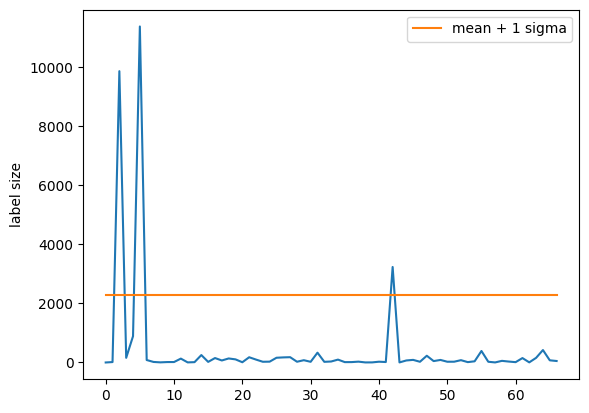

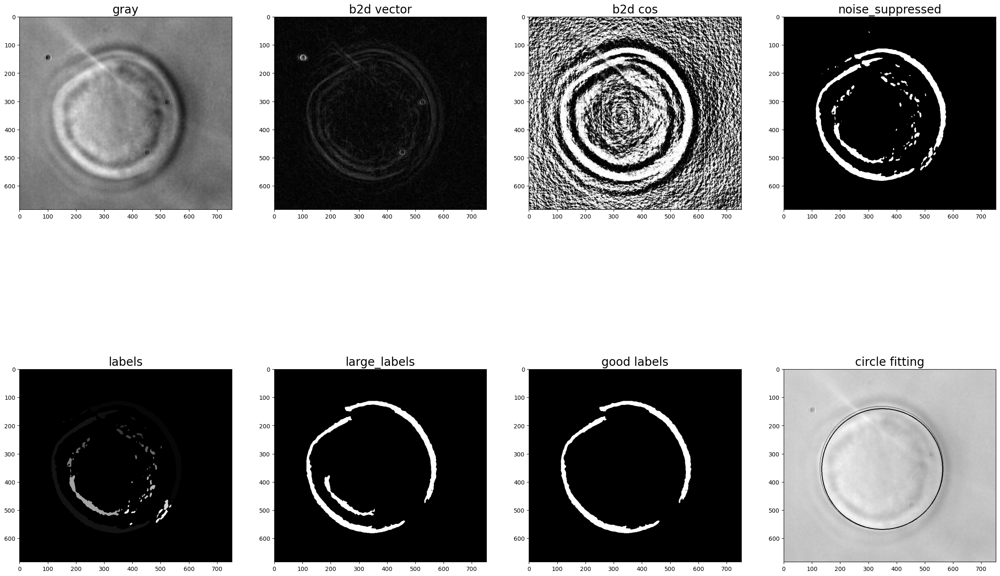

In [35]:
index = 30
result_images = test_run2(instance, index, 0.5)

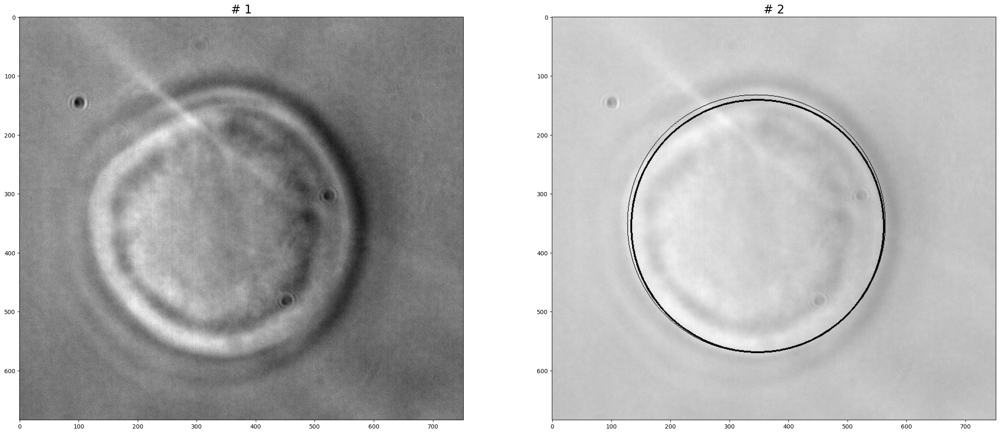

In [37]:
display_images([result_images[0], result_images[-1]])

In [13]:
list_appropriate_labels, list_arr_circle, list_arr_points = run2(instance, range(60))

In [ ]:
division_number = 12
angle = np.pi / 3 # 中心角が 2 * angle の扇形領域を考える
list_divided_curvature_radii = compute_list_divided_curvature_radii(list_appropriate_labels, list_arr_circle, division_number, angle)

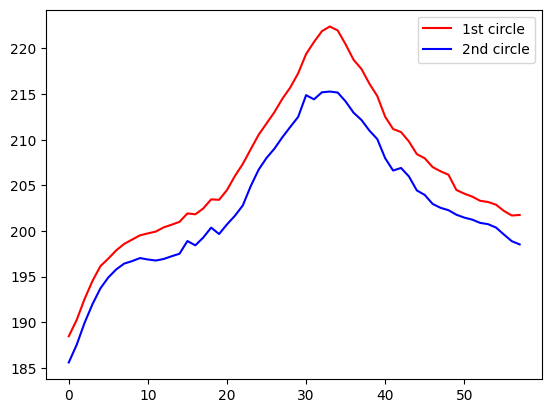

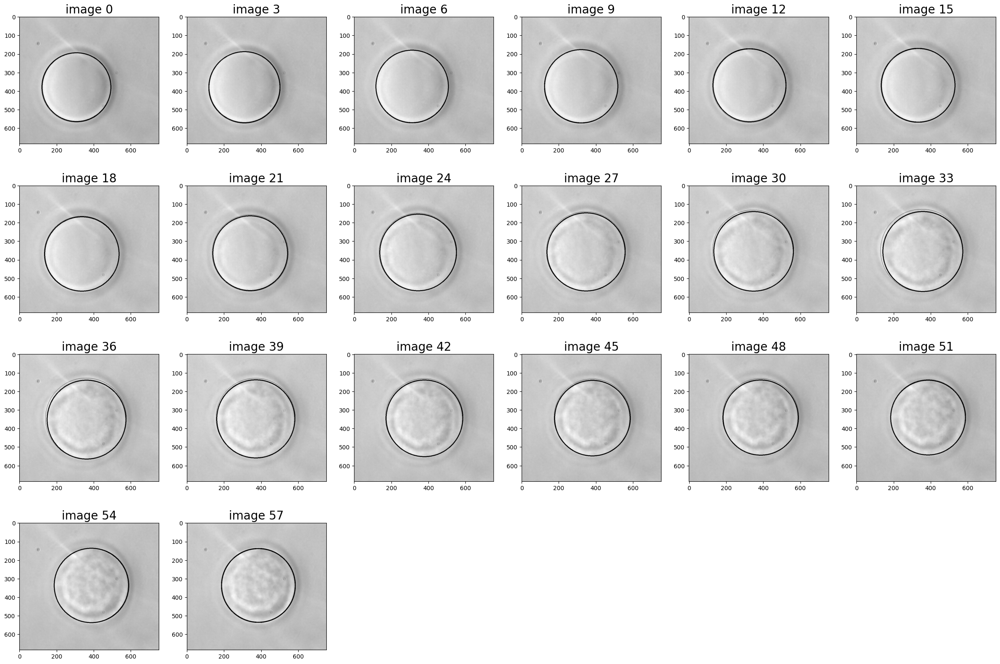

In [16]:
plot_circle_radii(list_arr_circle[:58])
visualize_circle(instance, list_arr_circle, range(0, 60, 3))

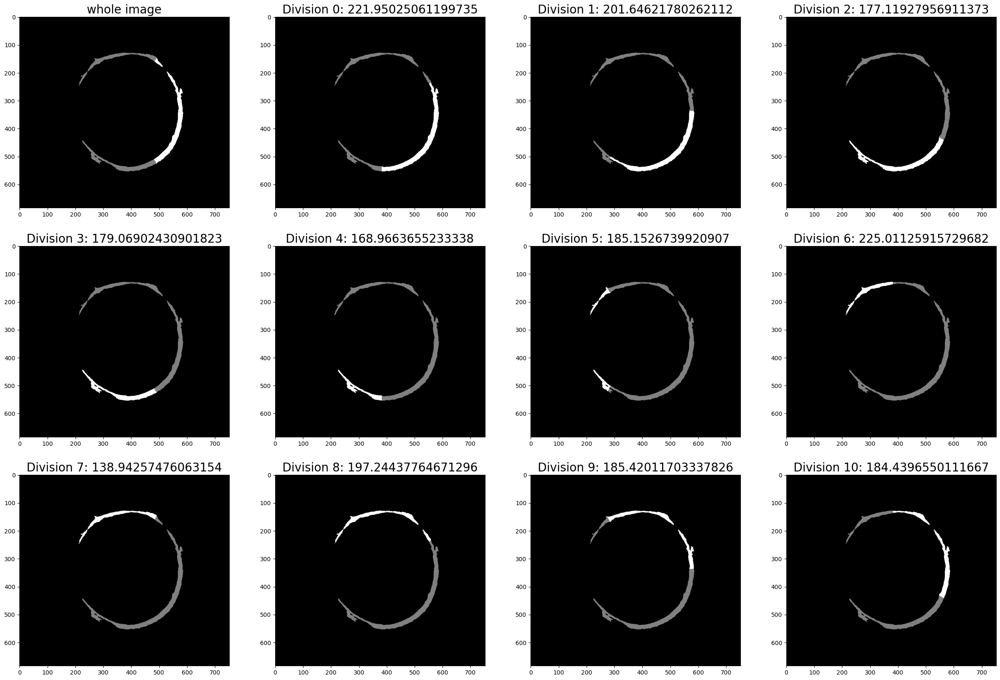

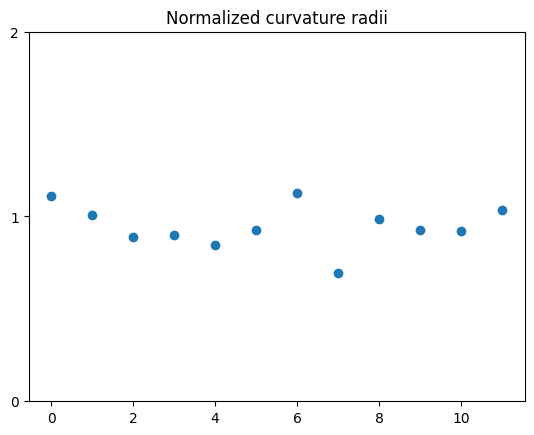

In [11]:
visualaize_curvature_radii_of_a_frame(59, list_appropriate_labels, list_arr_circle, division_number, angle)

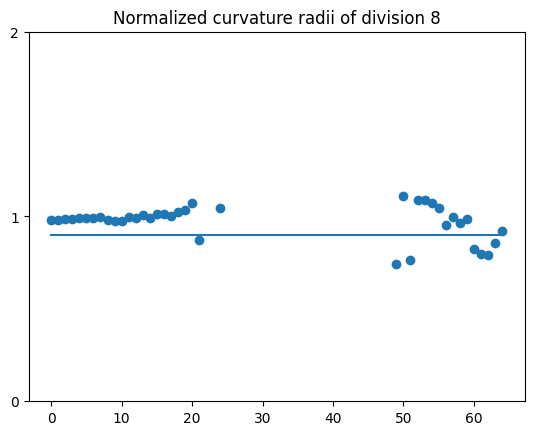

In [74]:
visualaize_curvature_radii_of_a_division_in_frames(8, list_divided_curvature_radii, list_arr_circle)


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

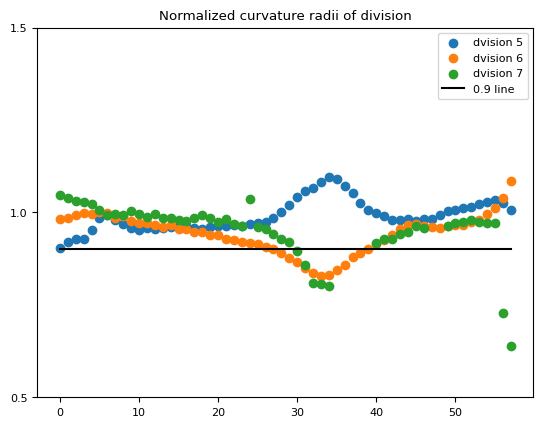

In [88]:
for division_index in [5, 6, 7]:
    curvature_radii = np.array([divided_curvature_radii[division_index] for divided_curvature_radii in list_divided_curvature_radii[:58]])
    radii = np.array([arr_circle[1][2] for arr_circle in list_arr_circle[:58]])

    xs = np.where(curvature_radii > 0)
    ys = (curvature_radii / radii)[xs]
    plt.scatter(xs, ys, label=f'dvision {division_index}')
plt.plot(range(len(curvature_radii)), np.ones(len(curvature_radii)) * 0.9, color='black', label='0.9 line')
plt.title(f'Normalized curvature radii of division')
plt.yticks([0.5, 1, 1.5])
plt.legend()
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']

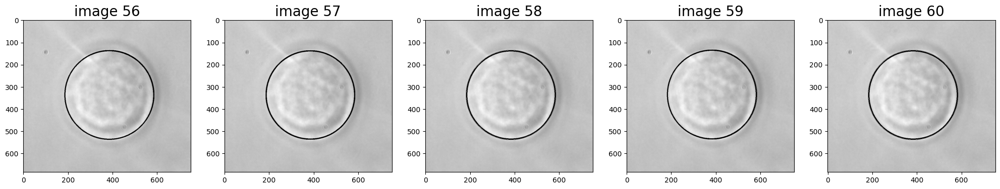

In [18]:
visualize_circle(list_arr_circle, [56, 57, 58, 59, 60])

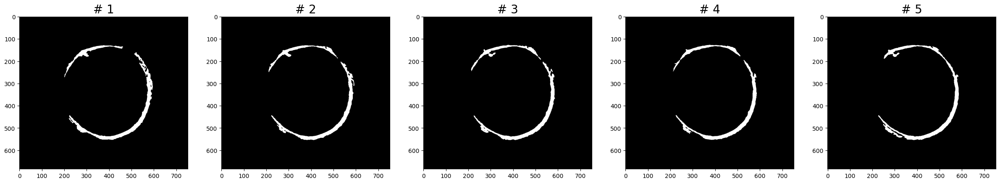

In [20]:
display_images(list_appropriate_labels[56:61])

# Progress report用

large label indices: [ 1  5 37]


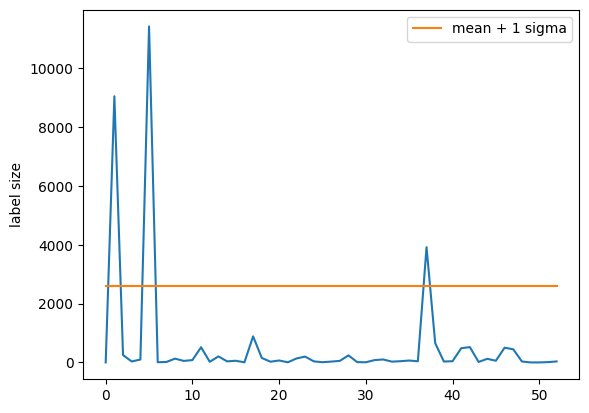

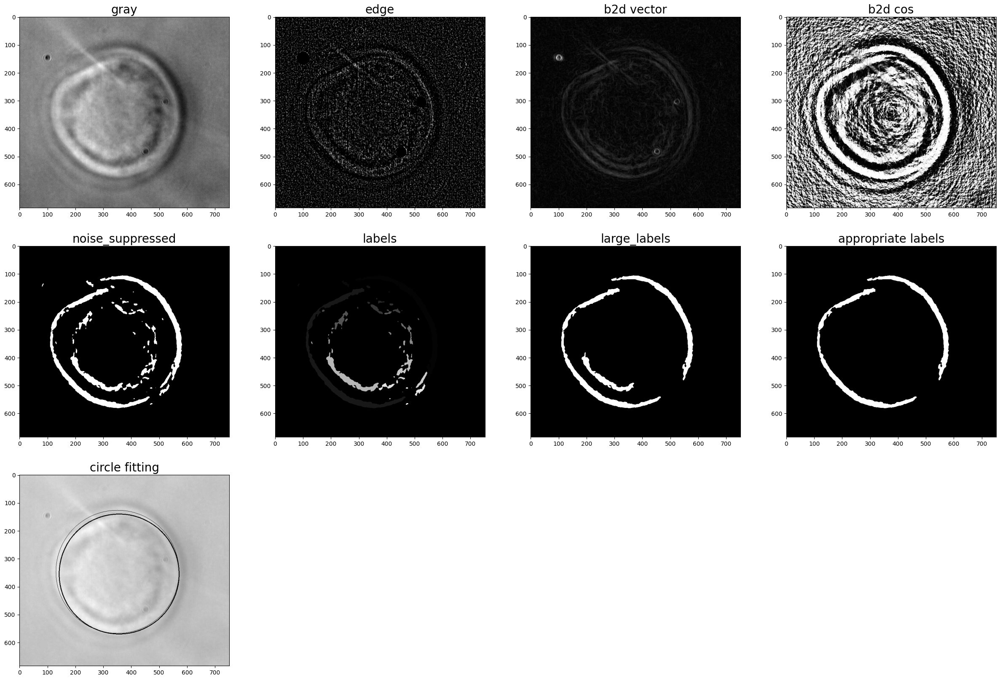

In [38]:
gray, edge, b2d_vector_image, b2d_cos_image, dilated, labels, large_labels, binary_image, canvas = test_run2(instance, 34)

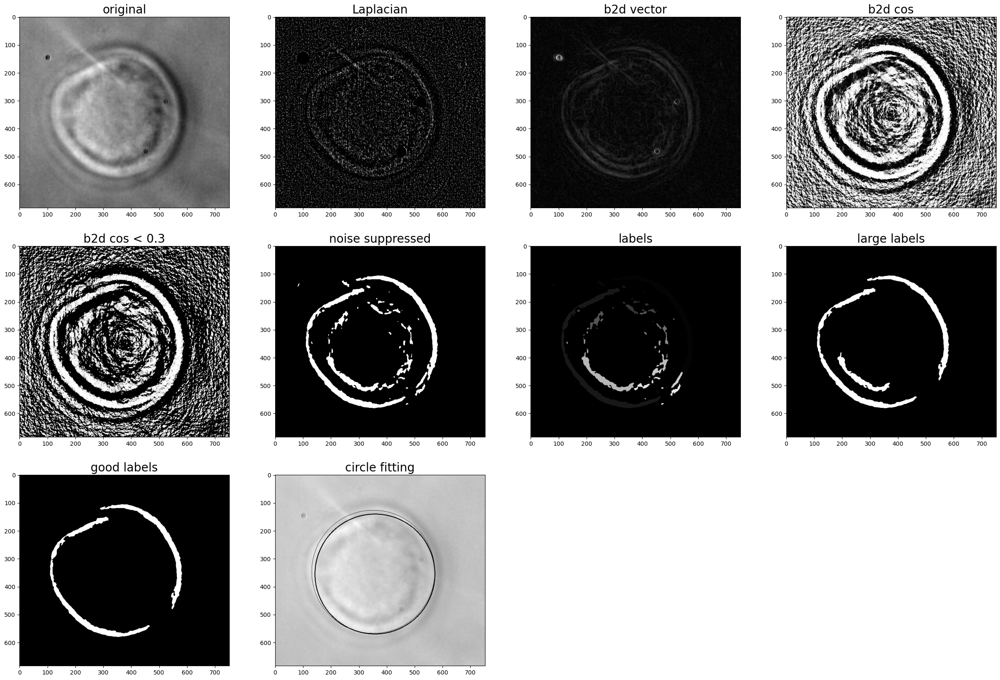

In [39]:
b2d_cos_image2 = b2d_cos_image.copy()
b2d_cos_image2[b2d_cos_image2 < 0.3] = 0
images = [gray, edge, b2d_vector_image, b2d_cos_image, b2d_cos_image2, dilated, labels, large_labels, binary_image, canvas]
names = ['original', 'Laplacian', 'b2d vector', 'b2d cos', 'b2d cos < 0.3', 'noise suppressed', 'labels', 'large labels', 'good labels', 'circle fitting']
display_images(images, names, w=4)

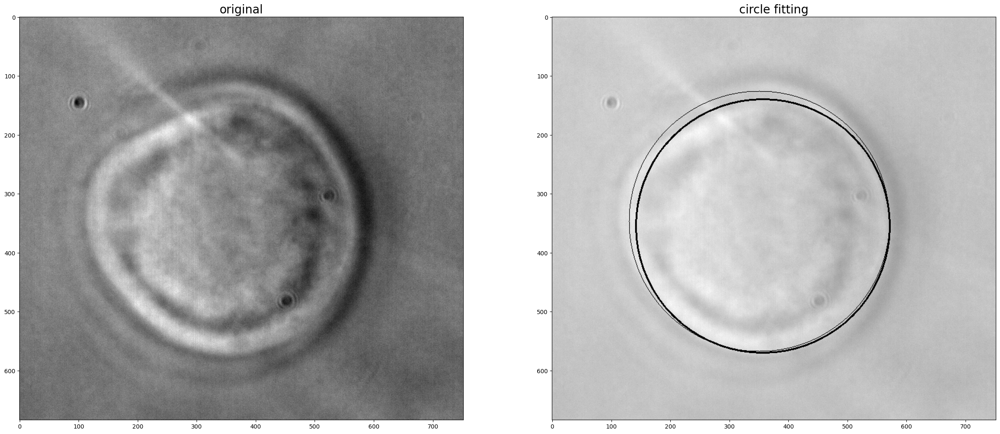

In [43]:
display_images([gray, canvas], ['original', 'circle fitting'])

In [67]:
index = 20
canvas20 = np.copy(instance.gray_images[index])
print(np.mean(canvas20))
for i in range(2):
    cx, cy, cr = map(int, list_arr_circle[index][i])
    cv2.circle(canvas20, (cx, cy), cr, color=10000 - i * 2000, thickness=1)

index = 34
canvas34 = np.copy(instance.gray_images[index])
print(np.mean(canvas34))
for i in range(2):
    cx, cy, cr = map(int, list_arr_circle[index][i])
    cv2.circle(canvas34, (cx, cy), cr, color=10000 - i * 2000, thickness=1)

10606.847807406371
10613.042942018166


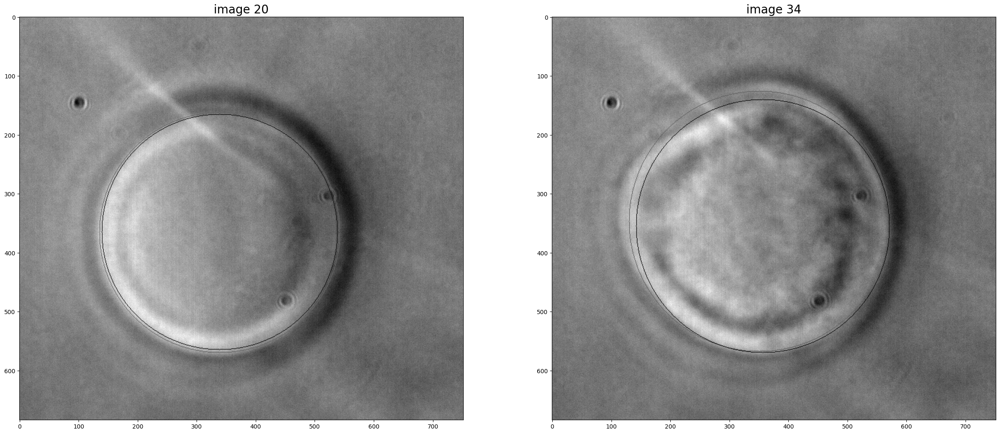

In [68]:
display_images([canvas20, canvas34], ['image 20', 'image 34'])

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

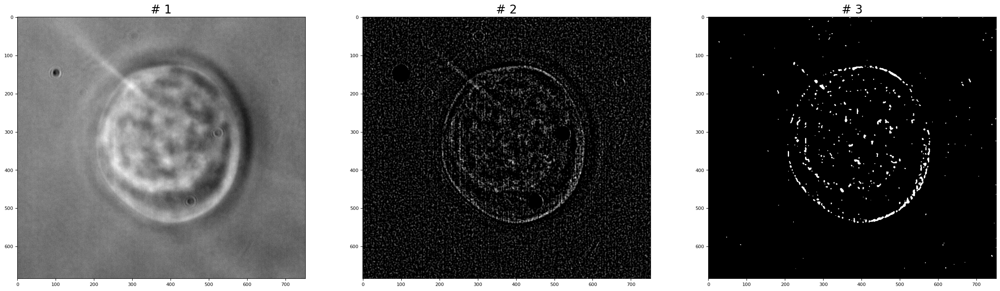

(412.35271317829455, 331.3458225667528)

In [107]:
from modules.helper import display_images
def f(gray, dilated_dust_mask, flat_image=None):
    if flat_image is None:
        flat_image = cv2.GaussianBlur(gray, ksize=(301, 301), sigmaX=0, sigmaY=0)
    flat_laplacian = abs(cv2.Laplacian(flat_image, cv2.CV_32F, ksize=5))

    edge = get_bright_edge(gray)
    edge[dilated_dust_mask == 1] = 0
    msk = edge.copy()
    msk[msk > 0] = 1
    msk[msk < 0] = 0
    msk[edge < np.mean(edge) + np.std(edge) * 2] = 0
    msk = cv2.medianBlur(msk.astype('uint8'), 5)

    display_images([gray, edge, msk])

    m = cv2.moments(msk, binaryImage=True)
    cx, cy= m['m10']/m['m00'] , m['m01']/m['m00']
    return cx, cy

gray = instance.gray_images[70]
dust_mask = get_dilated_mask(instance.dust_mask)
f(gray, dust_mask)